# Import packages and settings

In [1]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata
import numpy as np
import os
import gc
from datetime import date
import scipy

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [3]:
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize = (6,6))

# Load the data

In [1]:
### The data are from Allen brain map
### the matrix and the cells metadata are available here : https://portal.brain-map.org/atlases-and-data/rnaseq/human-m1-10x
### The genes metadata are available here : http://celltypes.brain-map.org/api/v2/well known file download/694416044

In [5]:
hdata = sc.read_csv('matrix.csv')

In [6]:
hdata

AnnData object with n_obs × n_vars = 76533 × 50281

In [7]:
# This is the initial counts
hdata.X.max()

8461.0

In [8]:
hdata.X

array([[ 0.,  0.,  0., ..., 19.,  0.,  0.],
       [ 0.,  0.,  0., ...,  3.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [9]:
hdata.layers['raw_counts']=hdata.X.copy()

In [10]:
metadata = pd.read_csv('metadata.csv')

In [11]:
metadata # same number of rows

,sample_name,exp_component_name,cluster_label,cluster_color,cluster_order,class_label,class_color,class_order,subclass_label,subclass_color,...,cell_type_designation_label,cell_type_designation_color,cell_type_designation_order,external_donor_name_label,external_donor_name_color,external_donor_name_order,specimen_type,full_genotype_label,outlier_call,outlier_type
0,AAACCCAAGGATTTCC-LKTX_190129_01_A01,AAACCCAAGGATTTCC-21L8TX_180927_001_A01,Inh L1-2 SST CCNJL,#fb8d00,50,GABAergic,#FF7373,1,Sst,#FF9900,...,Neuron 50,#fb8d00,50,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
1,AAACCCAAGTATGGCG-LKTX_190129_01_A01,AAACCCAAGTATGGCG-21L8TX_180927_001_A01,Exc L5-6 FEZF2 IFNG-AS1,#2c815f,116,Glutamatergic,#3DCC3D,2,L5/6 NP,#3E9E64,...,Neuron 116,#2c815f,116,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
2,AAACCCACAAAGTGTA-LKTX_190129_01_A01,AAACCCACAAAGTGTA-21L8TX_180927_001_A01,Exc L3-5 RORB LINC01202,#547d7a,87,Glutamatergic,#3DCC3D,2,L5 IT,#50B2AD,...,Neuron 87,#547d7a,87,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
3,AAACCCACACTACTTT-LKTX_190129_01_A01,AAACCCACACTACTTT-21L8TX_180927_001_A01,Exc L2 LINC00507 GLRA3,#cecd32,75,Glutamatergic,#3DCC3D,2,L2/3 IT,#C4EC04,...,Neuron 75,#cecd32,75,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
4,AAACCCACAGTGAGCA-LKTX_190129_01_A01,AAACCCACAGTGAGCA-21L8TX_180927_001_A01,Oligo L2-6 OPALIN FTH1P3,#003a28,120,Non-Neuronal,#171799,3,Oligo,#2E3E39,...,Non-neuron 3,#003a28,120,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76528,TTTGTTGAGATGGCGT-LKTX_190130_01_H01,TTTGTTGAGATGGCGT-35L8TX_181108_001_D01,Oligo L2-6 OPALIN FTH1P3,#003a28,120,Non-Neuronal,#171799,3,Oligo,#2E3E39,...,Non-neuron 3,#003a28,120,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
76529,TTTGTTGCACAGCCAC-LKTX_190130_01_H01,TTTGTTGCACAGCCAC-35L8TX_181108_001_D01,Exc L3-5 RORB LNX2,#01d9d5,90,Glutamatergic,#3DCC3D,2,L5 IT,#50B2AD,...,Neuron 90,#01d9d5,90,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
76530,TTTGTTGCAGAGACTG-LKTX_190130_01_H01,TTTGTTGCAGAGACTG-35L8TX_181108_001_D01,Exc L2-3 RORB PTPN3,#b7ce00,81,Glutamatergic,#3DCC3D,2,L2/3 IT,#C4EC04,...,Neuron 81,#b7ce00,81,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN
76531,TTTGTTGCATAATGAG-LKTX_190130_01_H01,TTTGTTGCATAATGAG-35L8TX_181108_001_D01,Oligo L2-6 OPALIN FTH1P3,#003a28,120,Non-Neuronal,#171799,3,Oligo,#2E3E39,...,Non-neuron 3,#003a28,120,H18.30.001,#FF7373,1,nucleus,NaN,False,NaN


In [12]:
sum(hdata.obs_names == metadata.sample_name)
# the df well correspond to the data

76533

In [13]:
hdata.obs = metadata

In [14]:
features = pd.read_csv('human_MTG_2018-06-14_genes-rows.csv')

In [15]:
features

,gene,chromosome,entrez_id,gene_name,mouse_homologenes
0,3.8-1.2,6,353007,HLA complex group 26 (non-protein coding) pseu...,NaN
1,3.8-1.3,6,353008,HLA complex group 26 (non-protein coding) pseu...,NaN
2,3.8-1.4,6,353009,HLA complex group 26 (non-protein coding) pseu...,NaN
3,3.8-1.5,6,353010,HLA complex group 26 (non-protein coding) pseu...,NaN
4,5-HT3C2,3,389180,"5-hydroxytryptamine (serotonin) receptor 3, fa...",NaN
...,...,...,...,...,...
50276,ZYX,7,7791,zyxin,Zyx
50277,ZZEF1,17,23140,"zinc finger, ZZ-type with EF-hand domain 1",Zzef1
50278,ZZZ3,1,26009,"zinc finger, ZZ-type containing 3",Zzz3
50279,bA255A11.4,9,259265,melanoma antigen pseudogene,NaN


In [16]:
hdata.var = features

In [24]:
hdata

AnnData object with n_obs × n_vars = 76533 × 50281
    obs: 'sample_name', 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type'
    var: 'gene', 'chromosome', 'entrez_id', 'gene_name', 'mouse_homologenes'

In [25]:
hdata.X

array([[ 0.,  0.,  0., ..., 19.,  0.,  0.],
       [ 0.,  0.,  0., ...,  3.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [26]:
hdata.var_names

RangeIndex(start=0, stop=50281, step=1)

In [27]:
hdata.layers['raw_counts']

array([[ 0.,  0.,  0., ..., 19.,  0.,  0.],
       [ 0.,  0.,  0., ...,  3.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [28]:
hdata.var['mouse_homologenes'].notna().sum()

16594

# Perform the analysis

In [20]:
#noramlize the data
sc.pp.normalize_total(hdata)

normalizing counts per cell
    finished (0:00:01)


In [21]:
sc.pp.log1p(hdata)

In [22]:
hdata.X.max()

8.241892

In [23]:
#Highly variable genes
sc.pp.highly_variable_genes(hdata)

extracting highly variable genes
    finished (0:00:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


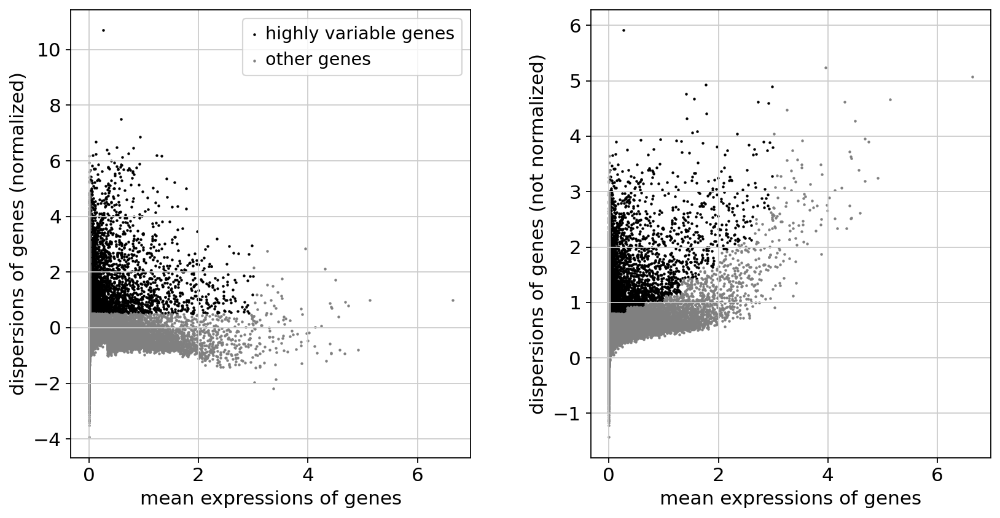

In [24]:
sc.pl.highly_variable_genes(hdata)
#### Didn't remove the HVG from the data
## If variance/mean > 1 then there is more dispersion than a random poisson distribution so they are important

In [25]:
hdata.raw = hdata

In [26]:
#### do i need to regress the data ? On which axis ? 
#sc.pp.regress_out(hdata,)
## Don't need to regress anything because we will lost information due to the linear regression

In [27]:
sc.pp.scale(hdata, max_value=10) #Z-Score scaling, mean=0, var=1, center the data

In [30]:
hdata.X

array([[ 0.        , -0.12956224,  0.        , ...,  1.5678674 ,
        -0.00361473, -0.00640491],
       [ 0.        , -0.12956224,  0.        , ...,  0.13147767,
        -0.00361473, -0.00640491],
       [ 0.        , -0.12956224,  0.        , ...,  0.30638075,
        -0.00361473, -0.00640491],
       ...,
       [ 0.        , -0.12956224,  0.        , ..., -1.5616204 ,
        -0.00361473, -0.00640491],
       [ 0.        , -0.12956224,  0.        , ...,  1.7170787 ,
        -0.00361473, -0.00640491],
       [ 0.        , -0.12956224,  0.        , ..., -1.5616204 ,
        -0.00361473, -0.00640491]], dtype=float32)

In [31]:
sc.tl.pca(hdata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


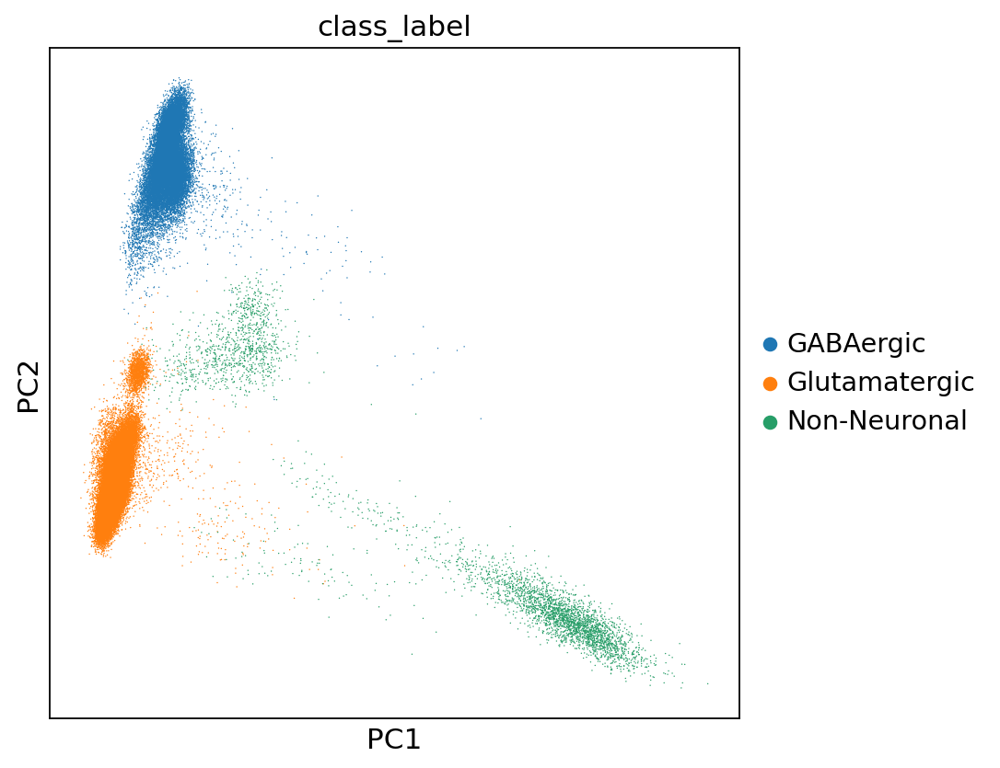

In [32]:
sc.pl.pca(hdata, color = 'class_label')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


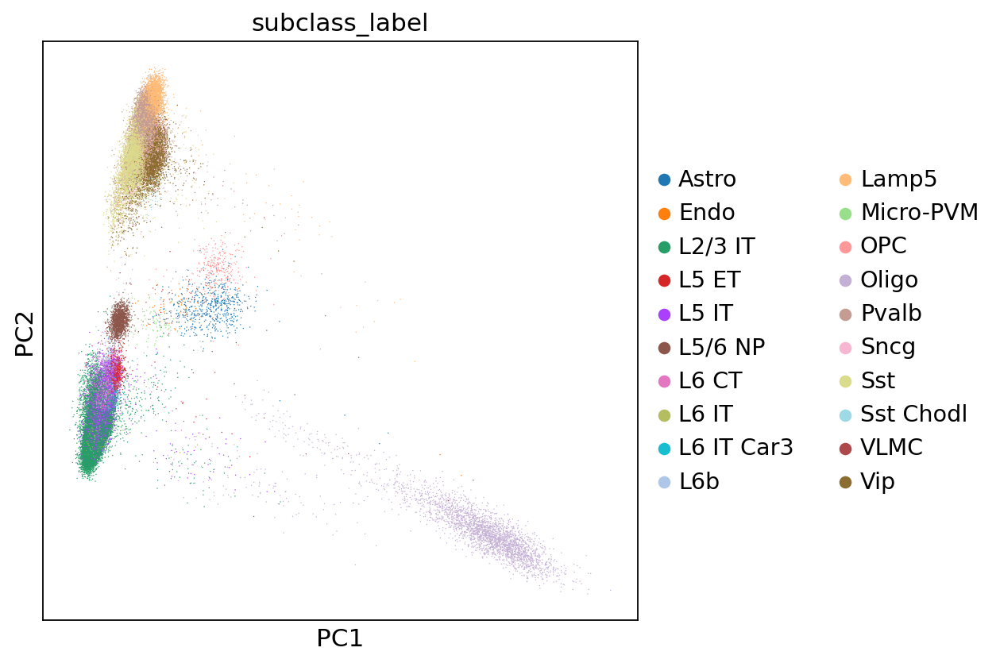

In [33]:
sc.pl.pca(hdata, color = 'subclass_label')

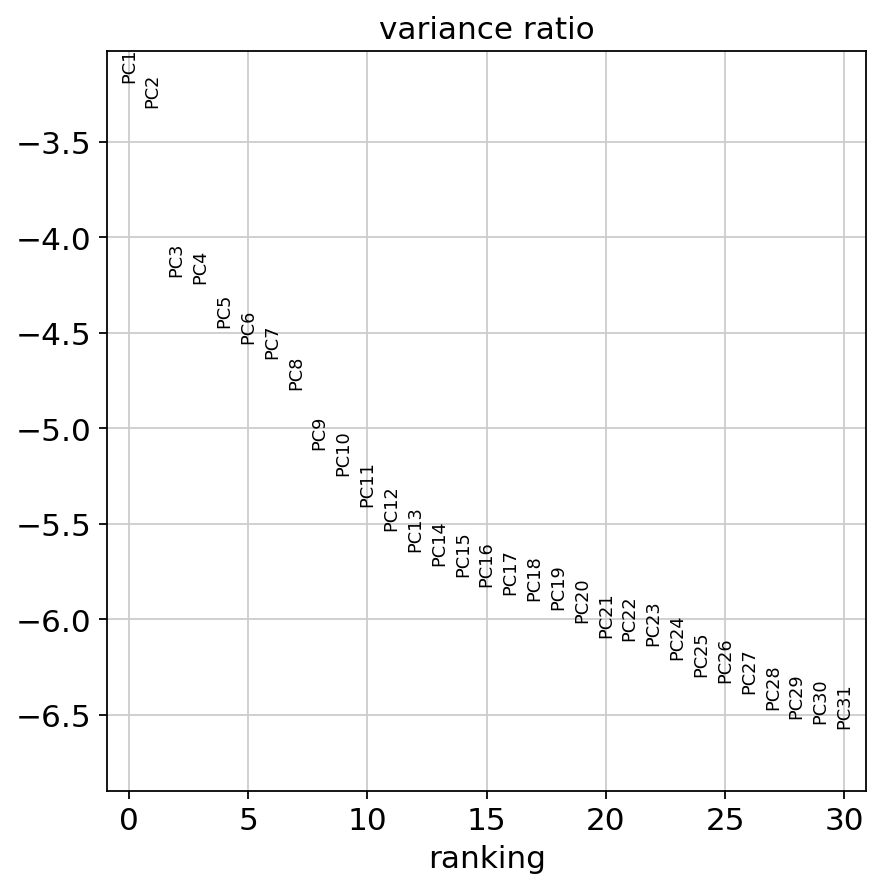

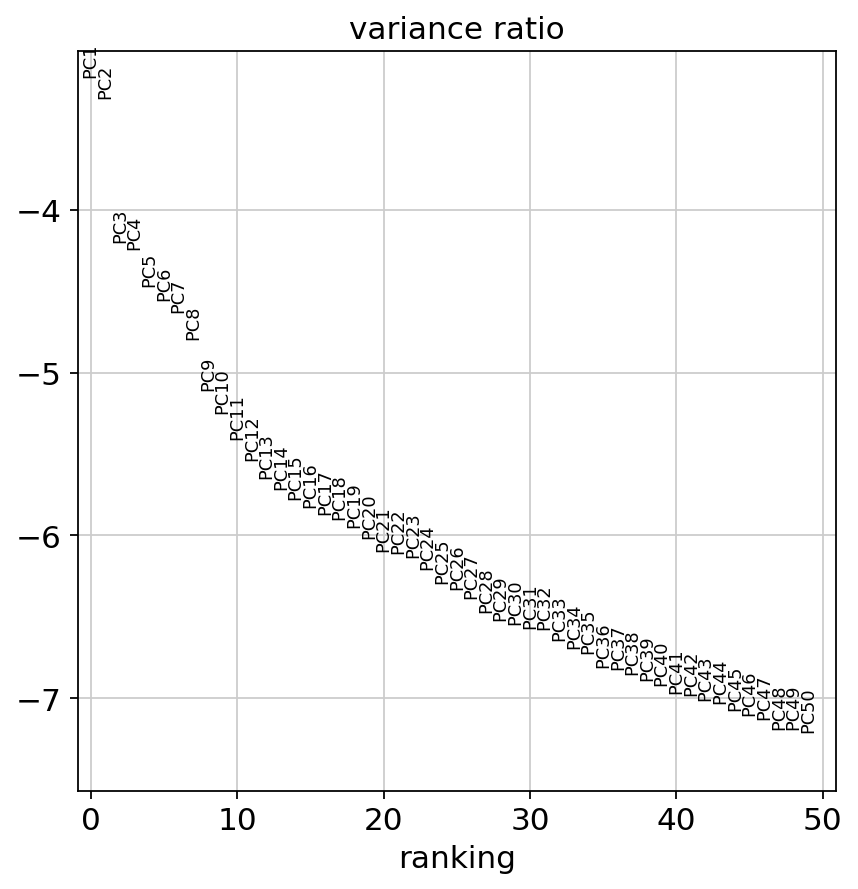

In [34]:
sc.pl.pca_variance_ratio(hdata, log=True, n_pcs=30) 
## Negatif because plotted on log-scale, 1 is the max, when <0 means the value is between 0 and 1
sc.pl.pca_variance_ratio(hdata, log=True, n_pcs=50) 
## Look w/ 50 to see where the courbe start to reach 0 and marginal value added is not acceptable
## Here we can see that we don't rich the plateau and 50 PCs are good 

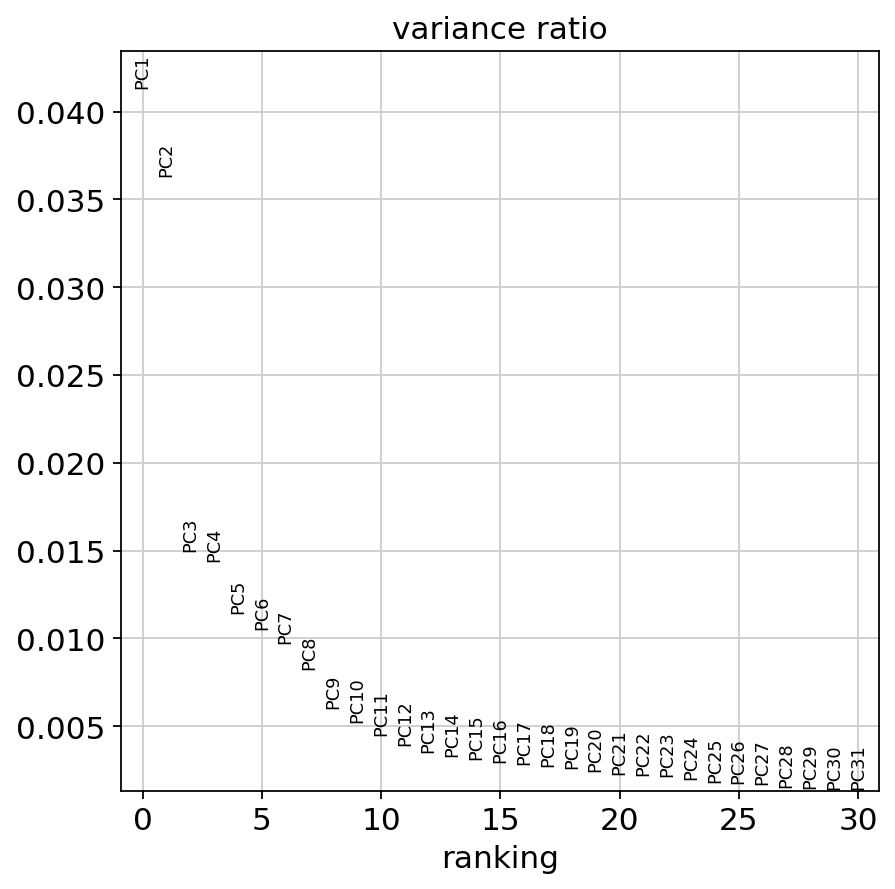

In [35]:
sc.pl.pca_variance_ratio(hdata, log=False) # Just to see that the value are well between 0 and 1 when we don't scale with the log

In [36]:
hdata

AnnData object with n_obs × n_vars = 76533 × 50281
    obs: 'sample_name', 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mea

In [37]:
sc.pp.neighbors(hdata) 
# here we are working with 50 principal components
# We use the pcs to see which cell is closer to which cells

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)


In [38]:
# Umap
sc.tl.umap(hdata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:00)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


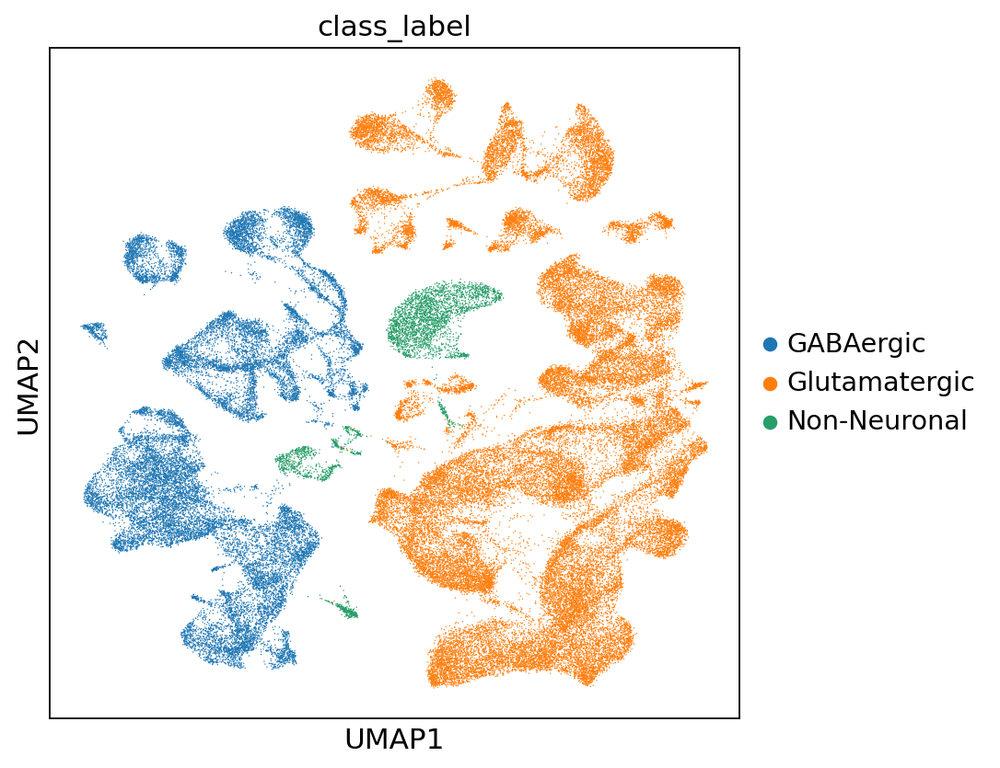

In [39]:
sc.pl.umap(hdata, color='class_label')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


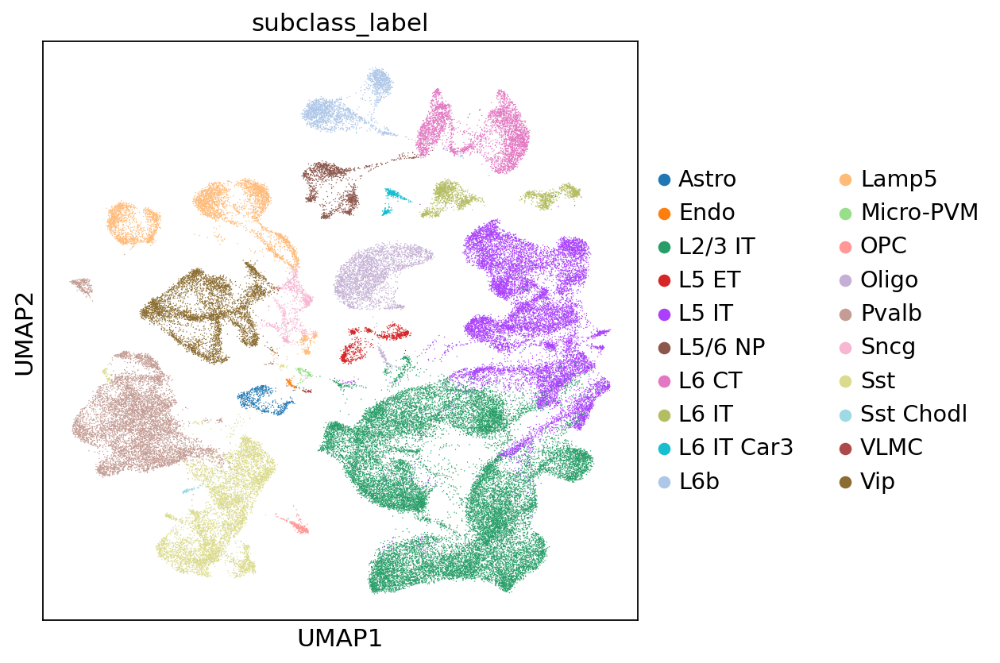

In [40]:
sc.pl.umap(hdata, color='subclass_label')

In [41]:
#clustering the neighborhood graph
sc.tl.leiden(hdata)
#leiden is a clustering technique
# usually divide a neighborhood graph into many smaller groups

running Leiden clustering
    finished: found 47 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:10)


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


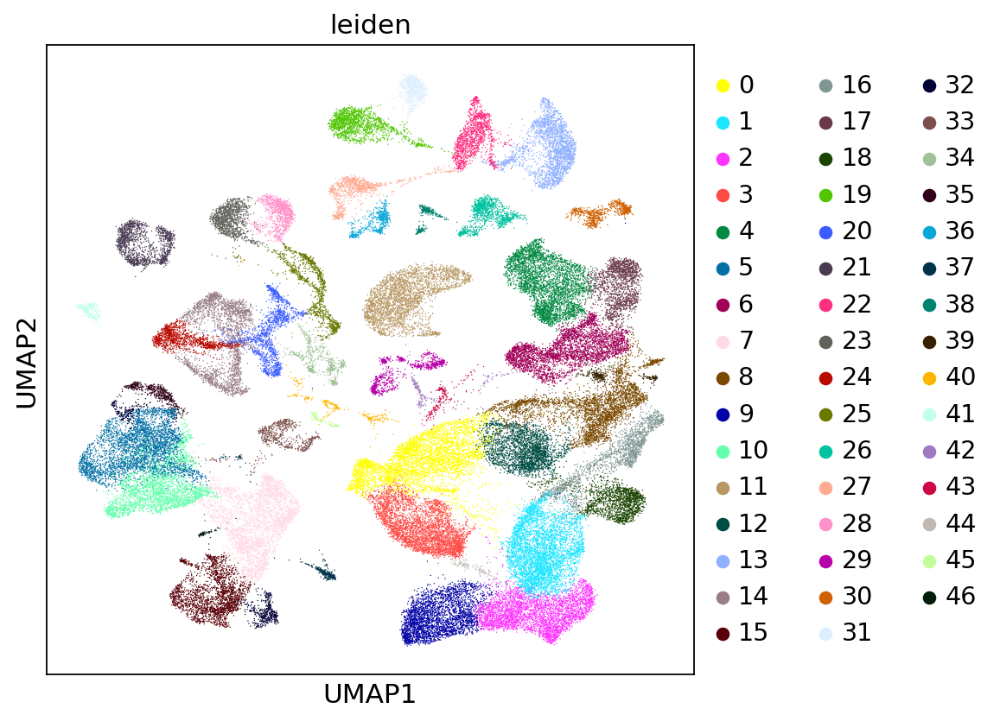

In [42]:
sc.pl.umap(hdata, color='leiden')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


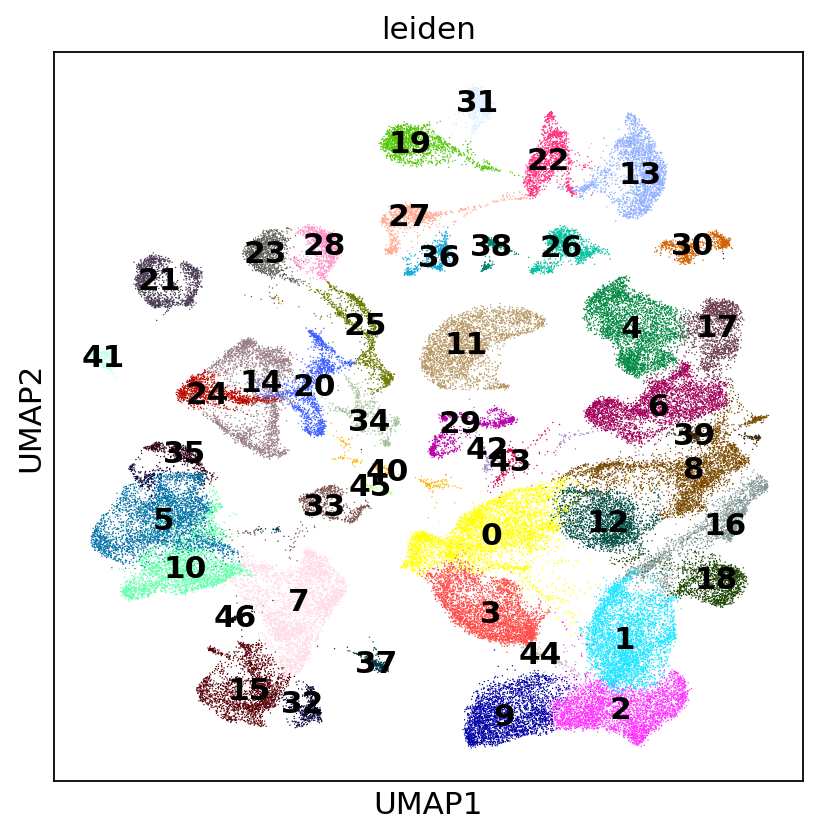

In [43]:
sc.pl.umap(hdata, color='leiden',legend_loc='on data')

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


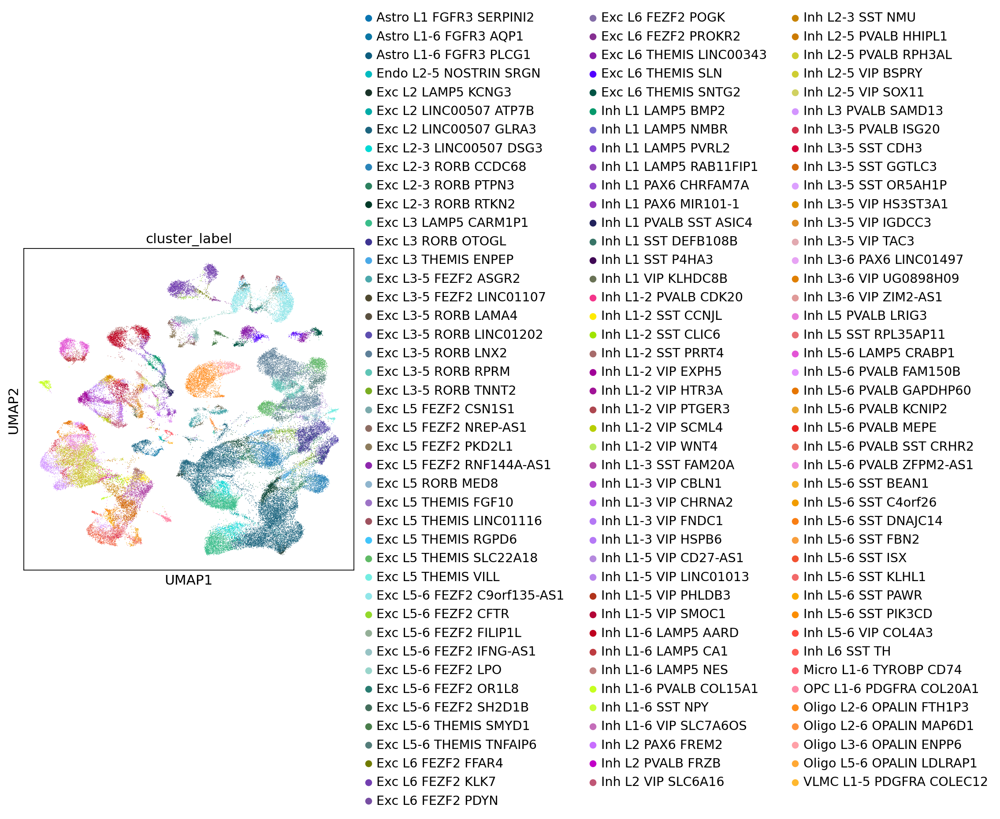

In [44]:
clusters = hdata.obs['cluster_label'].values
colors = hdata.obs['cluster_color'].values
colors = np.asarray(colors.categories)
clusters = np.asarray(clusters.categories)
palette_color = {}
for i in range (len(colors)):
    palette_color[clusters[i]]=colors[i]
    
sc.pl.umap(hdata, color='cluster_label',palette = palette_color)

ranking genes


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:12:56)


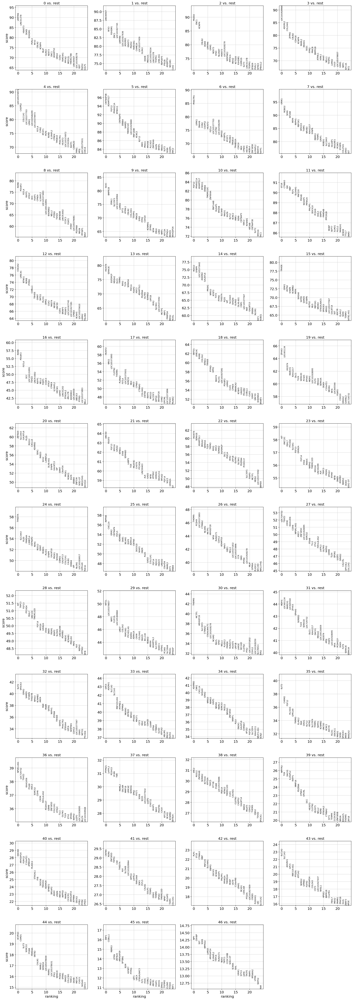

In [45]:
sc.tl.rank_genes_groups(hdata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(hdata, n_genes=25, sharey=False)

In [46]:
hdata

AnnData object with n_obs × n_vars = 76533 × 50281
    obs: 'sample_name', 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_n

In [47]:
pd.DataFrame(hdata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
0,LRRTM4,LINC00507,PDZD2,LOC101928964,LOC105374971,CNTNAP3B,PHACTR1,GRIK1,RORB,SV2C,...,PTPRZ1,ERC2,NPFFR2,DOCK8,CNTN5,PLP1,SLC1A2,ACVR1C,EBF1,NPY
1,LINC01378,RFX3,ENC1,ADGRL2,CADPS2,ADAMTS17,LRRK1,ROBO2,POU6F2,BMPR1B,...,LHFPL3,RGS12,TOX,ARHGAP24,RORA,ST18,SLC1A3,CSMD1,COBLL1,CRHBP
2,HS6ST3,R3HDM1,KCNIP4,COL24A1,COL11A1,FGF12,DNAH6,SOX6,FSTL4,VSNL1,...,PCDH15,ZNF804B,DACH1,P2RY12,ZNF385D,CTNNA3,ADGRV1,SLIT3,RBMS3,SST
3,DGKB,ENC1,CBLN2,ZFPM2,LOC105377703,PPARGC1A,CHN2,KIF26B,RXFP1,SLC35F3,...,VCAN,SORBS2,IL1RAPL2,C10orf11,TRPS1,MBP,GPC5,SORCS3,UTRN,SOX6
4,R3HDM1,LOC101927745,DGKB,CBLN2,LRRK1,BTBD11,CADPS2,XKR4,HTR1F,LOC101928964,...,TNR,KCTD16,RXFP1,APBB1IP,CA8,RNF220,RNF219-AS1,ITGB8,ZBTB20,MPPED2


/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


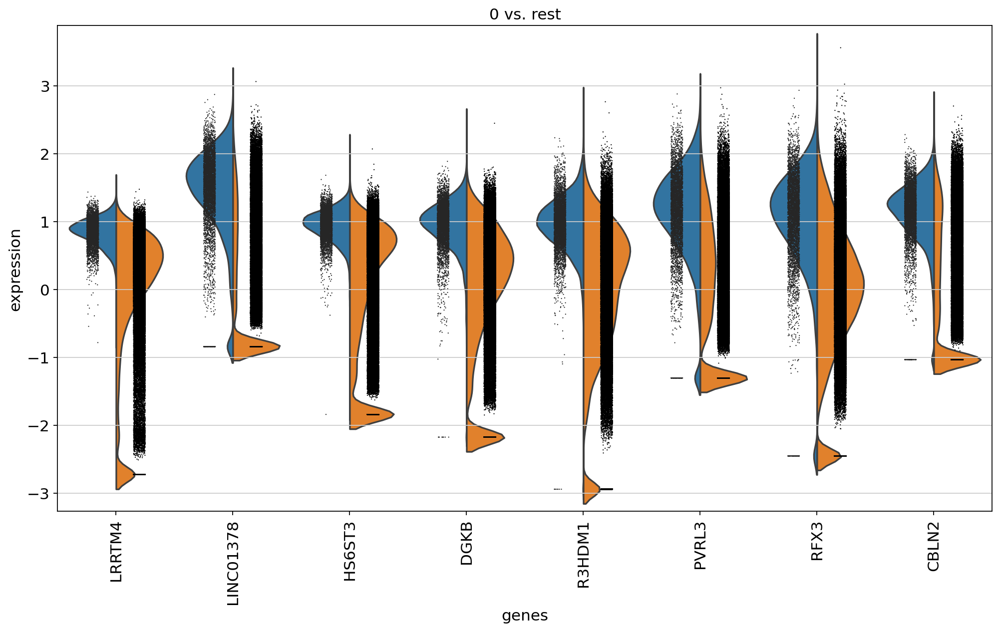

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


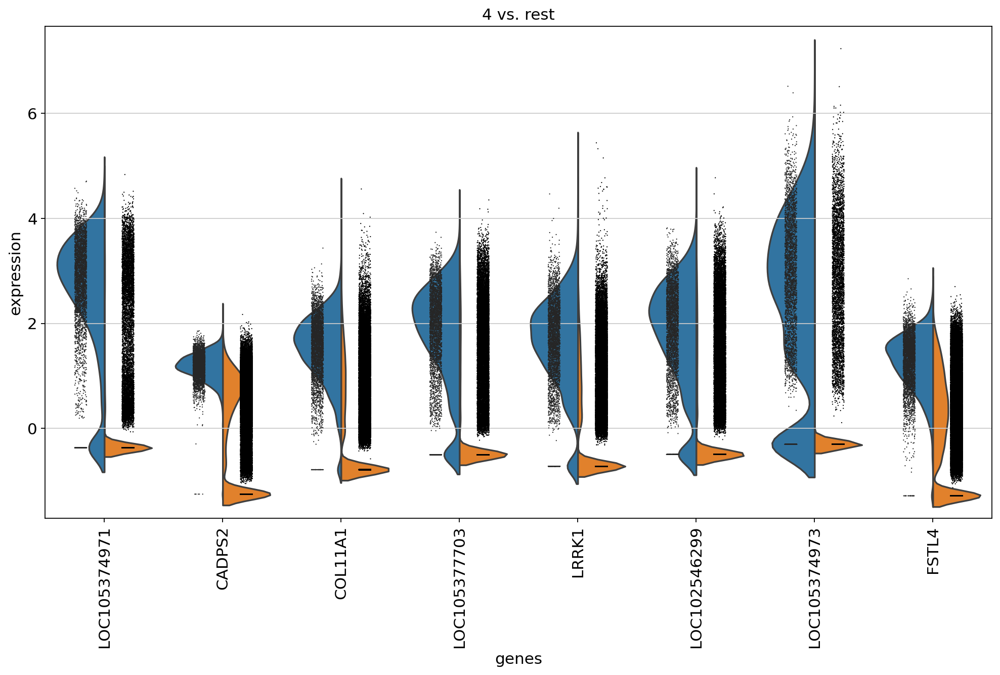

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


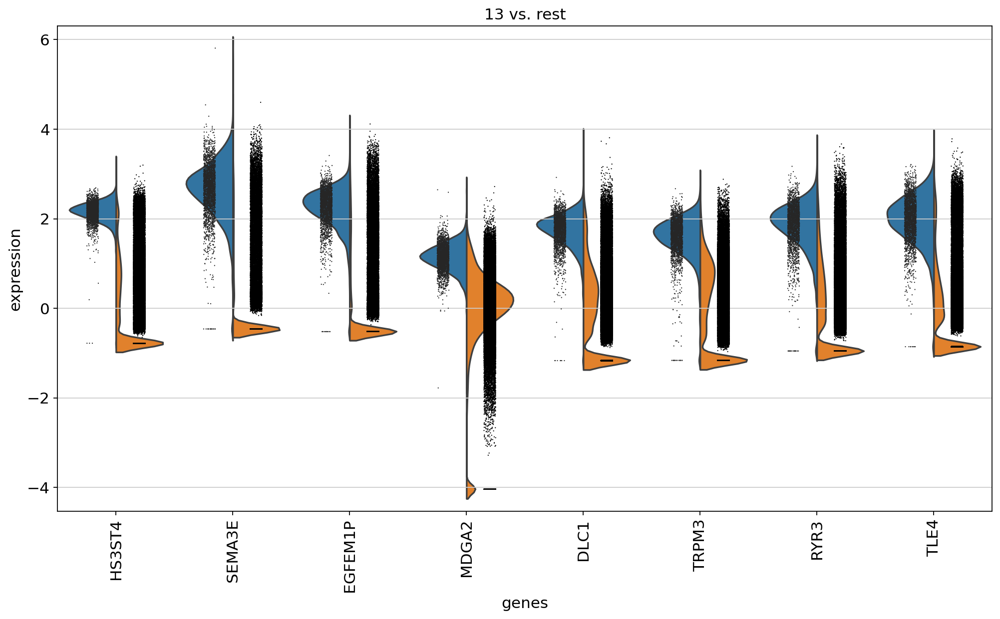

/nfs/research/irene/anaelle/miniconda3/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


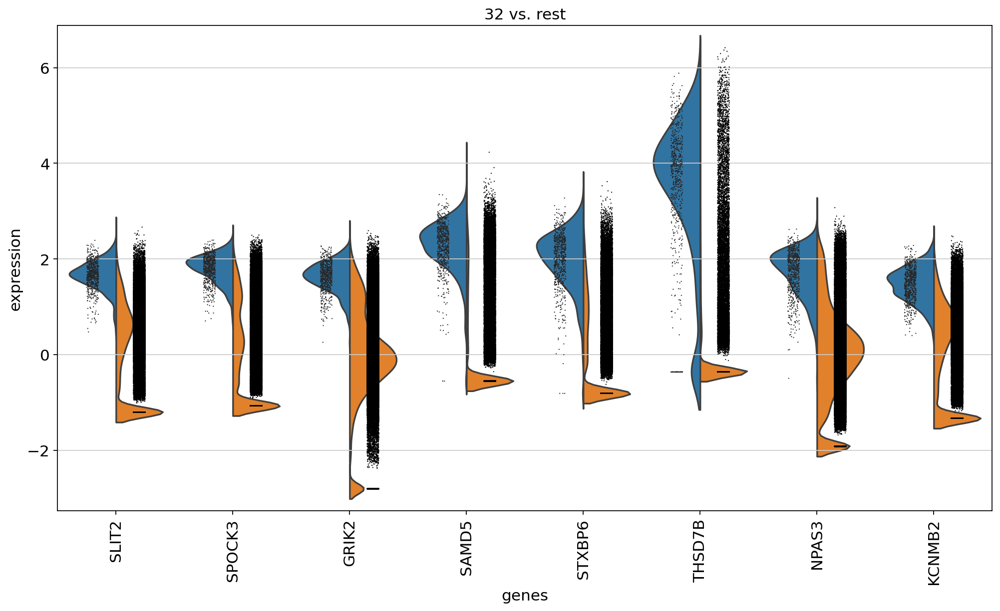

In [49]:
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize = (15,8))
sc.pl.rank_genes_groups_violin(hdata,groups=['0','4','13','32'], n_genes=8) 
# On this plot, the blue part is the expression in the group we are looking for, and the orange part is the experssion
# in all the groups

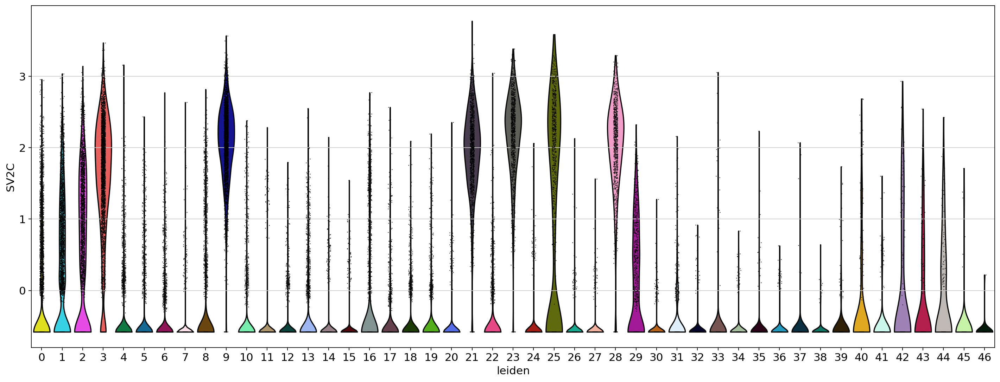

In [50]:
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize = (17,8))
sc.pl.violin(hdata,'SV2C',groupby='leiden')

In [51]:
hdata

AnnData object with n_obs × n_vars = 76533 × 50281
    obs: 'sample_name', 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_n

# Write the results

In [52]:
## Writes the highly variable genes in a csv file
# assuming that the anndata object is already loaded and analyzed using scanpy

# define the path where the CSV file will be saved

def write_marker_genes(adata, csv_path, pval_adj_cutoff=0.05):

    # get the rank_genes_groups object from adata.uns
    rank_genes_groups = adata.uns['rank_genes_groups']

    # create an empty dataframe to store the results
    results_df = pd.DataFrame()

    # loop through the cell types
    for ct in rank_genes_groups['names'].dtype.names:
        # create a dataframe with the marker genes for the current cell type
        ct_df = pd.DataFrame({
            'gene': rank_genes_groups['names'][ct],
            'score': rank_genes_groups['scores'][ct],
            'logfoldchanges': rank_genes_groups['logfoldchanges'][ct],
            'pvals': rank_genes_groups['pvals'][ct],
            'pvals_adj': rank_genes_groups['pvals_adj'][ct]
        })
        # add a column to indicate the cell type
        ct_df['cell_type'] = ct
        # append the results for the current cell type to the overall results dataframe
        results_df = pd.concat([results_df, ct_df], ignore_index=True)

    # save the results dataframe to a CSV file
    
    
    results_df.loc[results_df['pvals_adj'] < pval_adj_cutoff].to_csv(csv_path, index=False)

In [53]:
csv_path = os.path.dirname(os.path.realpath('human_data.ipynb'))
csv_path = csv_path + '/human_hvg_'+str(date.today())+'.csv'
csv_path

'/nfs/research/irene/anaelle/data/human/human_hvg_2023-06-01.csv'

In [54]:
write_marker_genes(hdata,csv_path)

In [55]:
raw_counts = hdata.layers['raw_counts']

In [56]:
del hdata.layers['raw_counts']

In [29]:
hdata.write_h5ad('hdata.h5ad',compression='gzip')

In [58]:
hdata.layers['raw_counts'] = raw_counts

In [59]:
hdata.layers['raw_counts']

array([[ 0.,  0.,  0., ..., 19.,  0.,  0.],
       [ 0.,  0.,  0., ...,  3.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  5.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]], dtype=float32)